# TACO Inspection Demo

This notebook contains several independent scripts that show how to load and visualize the dataset stats and annotated images:
- Section 1 shows the dataset stats
- Section 2 show the class hierarchical structure: super classes and classes
- Section 3 shows TACO images along with their segmentation masks

But first we need to load the annotations and some python libraries:

In [1]:
%matplotlib inline
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

dataset_path = '/dtu/datasets1/02514/data_wastedetection'
anns_file_path = dataset_path + '/' + 'annotations.json'

# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

print(super_cat_names)


Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500
['Aluminium foil', 'Battery', 'Blister pack', 'Bottle', 'Bottle cap', 'Broken glass', 'Can', 'Carton', 'Cup', 'Food waste', 'Glass jar', 'Lid', 'Other plastic', 'Paper', 'Paper bag', 'Plastic bag & wrapper', 'Plastic container', 'Plastic glooves', 'Plastic utensils', 'Pop tab', 'Rope & strings', 'Scrap metal', 'Shoe', 'Squeezable tube', 'Straw', 'Styrofoam piece', 'Unlabeled litter', 'Cigarette']


## 1.  Dataset statistics

This shows the number of annotations per category:

In [82]:
dataset.keys()

dict_keys(['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories'])

In [112]:
from copy import deepcopy
import colorsys
from matplotlib.patches import Polygon, Rectangle

image_size = 224

file_name = 'batch_11/000028.jpg'
file_path = '/dtu/datasets1/02514/data_wastedetection/'
def get_image_ground_truth(filename):
    #----------------------------------------------
    # Function to find the ground truth annotation for each resized image 
    #----------------------------------------------

    # Find the image id in the annotation file
    for img in dataset['images']:
        if img['file_name'] == filename:
            my_img = deepcopy(img)

    w_factor = float(image_size)/my_img['width']
    h_factor = float(image_size)/my_img['height']

    # Finding all the annotations for one image - maybe try to optimize it by using pandas?
    img_annots = {}
    img_annots['id'] = []
    img_annots['bbox'] = []
    img_annots['category_id'] = []
    img_annots['supercategory'] = []
    for annot in dataset['annotations']:
        if annot['image_id'] == my_img['id']:
            #print(annot['id'], annot['bbox'], annot['category_id'])#, dataset['categories']['id'][annot['id']])
            img_annots['id'].append(annot['id'])
            img_annots['bbox'].append([round(annot['bbox'][0]*w_factor,1), round(annot['bbox'][1]*h_factor,1), round(annot['bbox'][2]*w_factor,1), round(annot['bbox'][3]*h_factor,1)])
            img_annots['category_id'].append(annot['category_id'])
            for cat in dataset['categories']:
                if cat['id'] == annot['category_id']:
                    #print(cat['supercategory'])
                    img_annots['supercategory'].append(cat['supercategory'])
                    
    return img_annots
                         
# All the images have to be resized to the standard size and hence the annotation boxes coordinates
# [x, y, w, h] = ann['bbox']

def get_image_proposals(filepath):
    # Get the proposals for an image
    image = cv2.imread(filepath)
    image = cv2.resize(image,(224,224))
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchFast()
    prop = ss.process()[:2000]
    return prop


def get_iou(bb1, bb2):
    # bb1 = [x1 y1 w1 h1]
    # bb2 = [x2 y2 w2 h2]
    
    #x1_bb1 = bb1[0]
    #y1_bb1 = bb1[1]
    #x2_bb1 = bb1[0] + bb1[2]
    #y2_bb1 = bb1[1] + bb1[3]
    
    #x1_bb2 = bb2[0]
    #y1_bb2 = bb2[1]
    #x2_bb2 = bb2[0] + bb2[2]
    #y2_bb2 = bb2[1] + bb2[3]
    
    # assuring for proper dimension.
    assert bb1[0] < bb1[0] + bb1[2]
    assert bb1[1] < bb1[1] + bb1[3]
    assert bb2[0] < bb2[0] + bb2[2]
    assert bb2[1] < bb2[1] + bb2[3]
    # calculating dimension of common area between these two boxes.
    x_left = max(bb1[0], bb2[0])
    y_top = max(bb1[1], bb2[1])
    x_right = min(bb1[0] + bb1[2], bb2[0] + bb2[2])
    y_bottom = min(bb1[1] + bb1[3], bb2[1] + bb2[3])
    # if there is no overlap output 0 as intersection area is zero.
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    # calculating intersection area.
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    # individual areas of both these bounding boxes.
    bb1_area = (bb1[2]) * (bb1[3])
    bb2_area = (bb2[2]) * (bb2[3])
    # union area = area of bb1_+ area of bb2 - intersection of bb1 and bb2.
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

img_annots = get_image_ground_truth(file_name)
prop = get_image_proposals(file_path + file_name)

/dtu/datasets1/02514/data_wastedetection/batch_11/000028.jpg


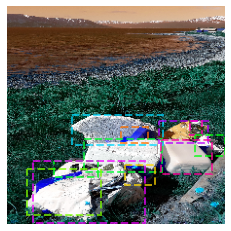

In [113]:
fig,ax = plt.subplots(1)
plt.axis('off')
plt.imshow(image)

# Show annotations
for box in img_annots['bbox']:
    #print(box)
    color = colorsys.hsv_to_rgb(np.random.random(),1,1)
    
    rect = Rectangle((box[0],box[1]),box[2],box[3],linewidth=2,edgecolor=color,
                    facecolor='none', alpha=0.7, linestyle = '--')
    ax.add_patch(rect)

plt.show()

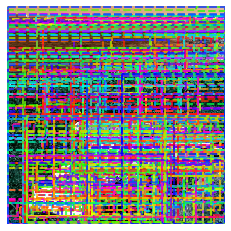

In [114]:
fig,ax = plt.subplots(1)
plt.axis('off')
plt.imshow(image)

# Show annotations
for box in prop:
    #print(box)
    color = colorsys.hsv_to_rgb(np.random.random(),1,1)
    
    rect = Rectangle((box[0],box[1]),box[2],box[3],linewidth=2,edgecolor=color,
                    facecolor='none', alpha=0.7, linestyle = '--')
    ax.add_patch(rect)

plt.show()

In [115]:
def assign_category_to_proposal(prop, img_annots):
    assignemt_prob = np.zeros([len(prop),len(img_annots['id'])])

    for i in range(len(prop)):
        for j in range(len(img_annots['bbox'])):
            assignemt_prob[i,j] = get_iou(np.array(prop[i]),np.array(img_annots['bbox'][j]))
            
    prop_categories = np.empty(len(prop))

    for i in range(len(prop)):
        if not (assignemt_prob[i,:] > 0.5).any(): 
            prop_categories[i] = 999
        else:
            index = np.argmax(assignemt_prob[i,:])
            prop_categories[i] = img_annots['category_id'][index]
            
    return prop_categories
        
#if np.any
#np.array_equal(assignemt_prob[i,:-1],np.zeros(len(img_annots['id']),dtype=float)):
#    assignemt_prob[i,-1] = 1
        
#Find argmax and then find the category id corresponding to the argmax
# If all the values are less then 0.5, then it is background


In [116]:
prop_categories = assign_category_to_proposal(prop, img_annots)

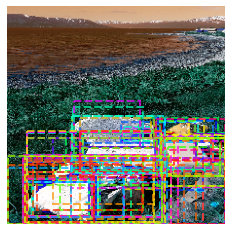

In [117]:
fig,ax = plt.subplots(1)
plt.axis('off')
plt.imshow(image)

# Show annotations
j = 0
for box in prop:
    if prop_categories[j] != 999:
        #print(box)
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)

        rect = Rectangle((box[0],box[1]),box[2],box[3],linewidth=2,edgecolor=color,
                        facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)
    j+=1

plt.show()

/tmp/ipykernel_220880/622915498.py:11: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_values except for the argument 'by' will be keyword-only.
  df = df.sort_values('Number of annotations', 0, False)


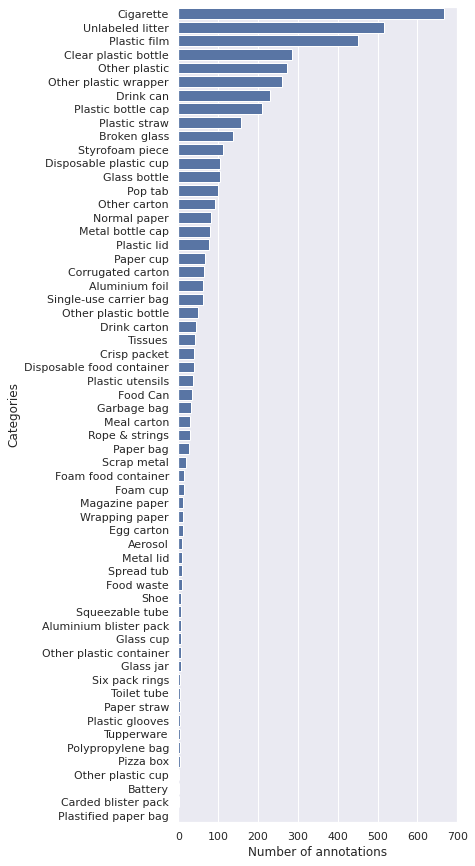

In [35]:
# Count annotations
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,15))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
# sns.set_color_codes("pastel")
# sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df,
            label="Total", color="b")

# fig = plot_1.get_figure()
# fig.savefig("output.png")

and this shows the number of annotations per super category:

/tmp/ipykernel_29032/224679470.py:17: FutureWarning: In a future version of pandas all arguments of DataFrame.sort_values except for the argument 'by' will be keyword-only.
  df = df.sort_values('Number of annotations', 0, False)


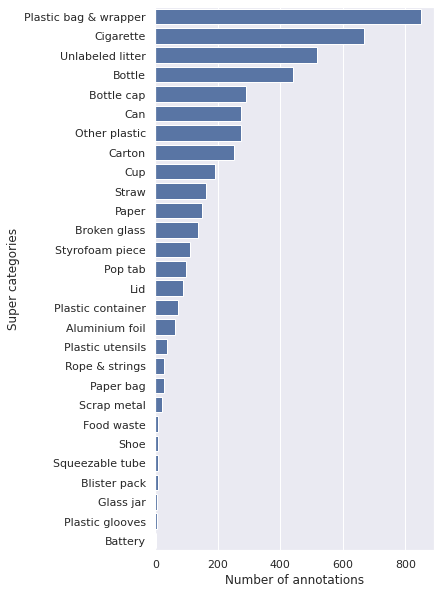

In [12]:
cat_ids_2_supercat_ids = {}
for cat in categories:
    cat_ids_2_supercat_ids[cat['id']] = super_cat_ids[cat['supercategory']]

# Count annotations
super_cat_histogram = np.zeros(nr_super_cats,dtype=int)
for ann in anns:
    cat_id = ann['category_id']
    super_cat_histogram[cat_ids_2_supercat_ids[cat_id]] +=1
    
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,10))

# Convert to DataFrame
d ={'Super categories': super_cat_names, 'Number of annotations': super_cat_histogram}
df = pd.DataFrame(d)
df = df.sort_values('Number of annotations', 0, False)

# sns.set_color_codes("pastel")
# sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Super categories", data=df,
            label="Total", color="b")
#plot_1.set_title('Annotations per super category',fontsize=20)   

### 1.1  Background stats

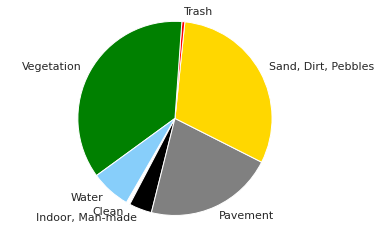

In [13]:
# Get scene cat names
scene_cats = dataset['scene_categories']
scene_name = []
for scene_cat in scene_cats:
    scene_name.append(scene_cat['name'])

nr_scenes = len(scene_cats)
scene_cat_histogram = np.zeros(nr_scenes,dtype=int)

for scene_ann in dataset['scene_annotations']:    
    scene_ann_ids = scene_ann['background_ids']
    for scene_ann_id in scene_ann_ids:
        if scene_ann_id<len(scene_cats):
            scene_cat_histogram[scene_ann_id]+=1

# Convert to DataFrame
df = pd.DataFrame({'scene_cats': scene_cats, 'nr_annotations': scene_cat_histogram})
 
# Plot
colors = ['white','black','gray', 'gold', 'red','green','lightskyblue']
plt.pie(scene_cat_histogram, labels=scene_name, colors = colors,
      shadow=False, startangle=-120)
 
plt.axis('equal')
plt.show()

## 2. Visualize dataset graph

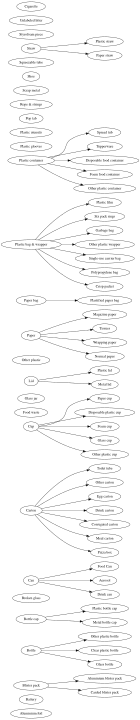

In [14]:
from graphviz import Digraph
# Note: graphviz may require more than pip installation due to path issue: e.g. brew install graphviz for mac

#g = Digraph('G', filename='hello.gv')
dot = Digraph('Dataset graph', filename='asd.gv')
dot.attr(rankdir='LR', size='8,10')

for cat_it in categories:
    dot.node(cat_it['name'])
    if cat_it['name']==cat_it['supercategory']:
        dot.node(cat_it['supercategory'])
    else:
        dot.edge(cat_it['supercategory'], cat_it['name'])
dot
# Uncomment next line to print pdf
#dot.view()

## 3. Visualize Annotated Images

For simplicity, to select and show the dataset images with the respective masks, we make use of the COCO API.
The script below shows how to load and visualize an image with all its annotations.

Unfortunately, several python libraries do not take into account the EXIF orientation tag, thus we have to explicitly rotate the images. Alternatively you can use instead OpenCV.

loading annotations into memory...
Done (t=0.17s)
creating index...
index created!
batch_11/000028.jpg


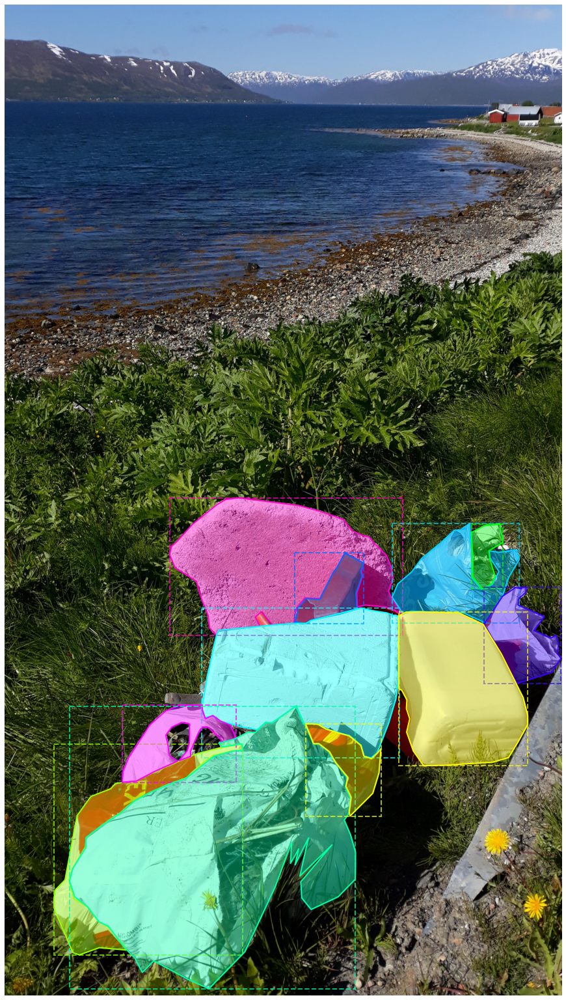

In [17]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
image_filepath = 'batch_11/000028.jpg'
pylab.rcParams['figure.figsize'] = (28,28)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Find image id
img_id = -1
for img in imgs:
    if img['file_name'] == image_filepath:
        img_id = img['id']
        break

# Show image and corresponding annotations
if img_id == -1:
    print('Incorrect file name')
else:

    # Load image
    print(image_filepath)
    I = Image.open(dataset_path + '/' + image_filepath)

    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
    anns_sel = coco.loadAnns(annIds)

    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()



The script below shows how to filter images by either category or supercategory.

Go ahead and try different (super)categories searches by changing the `category_name`.
Note that small objects may be hard to see.

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Number of images found:  322


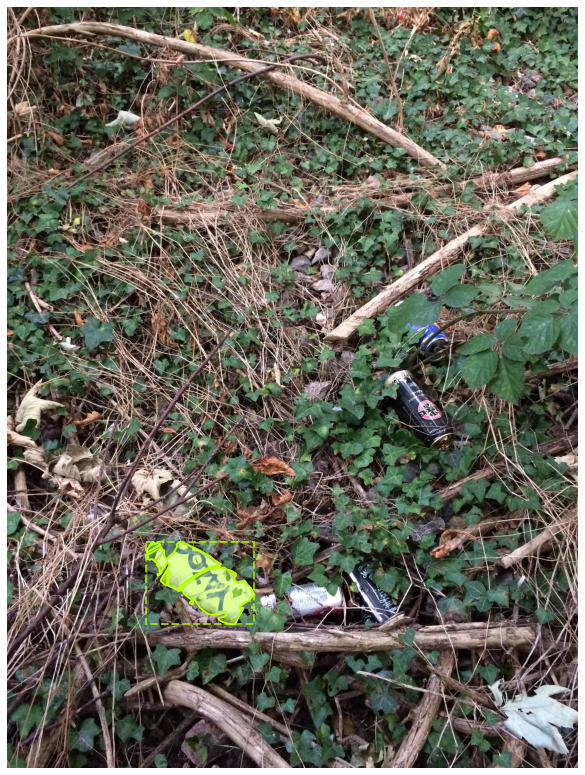

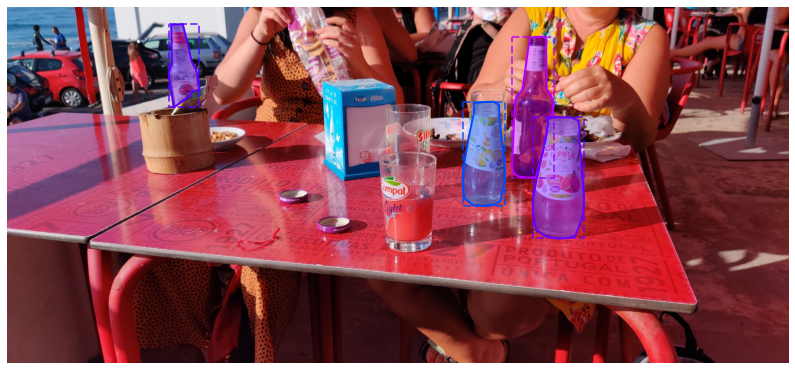

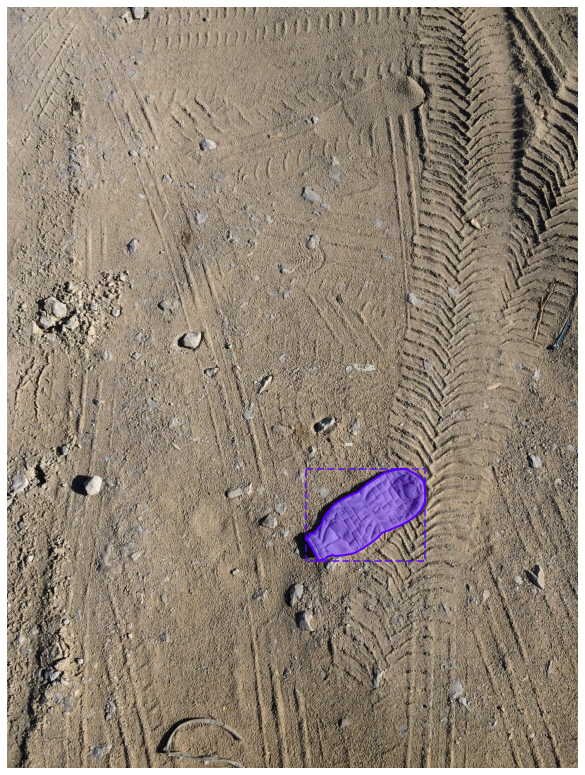

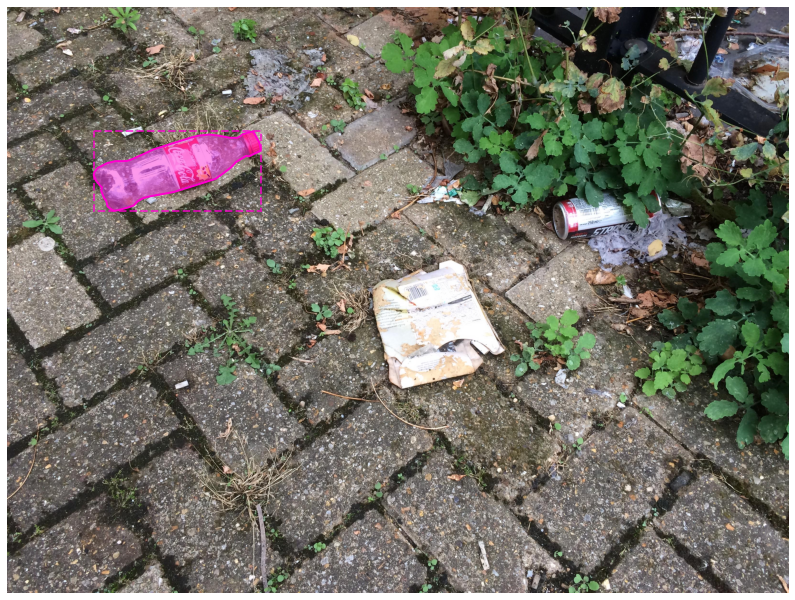

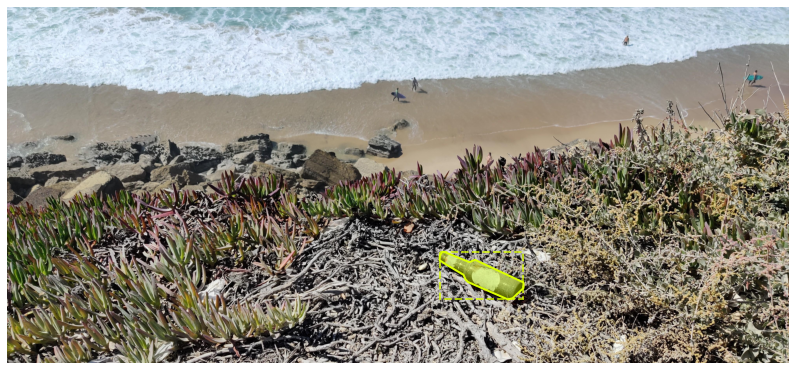

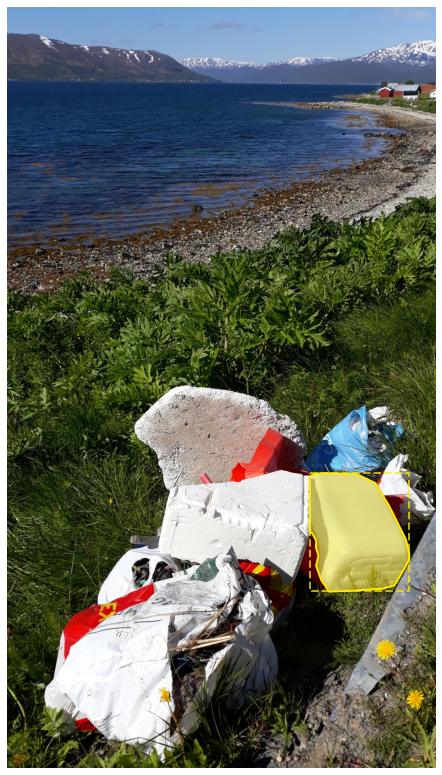

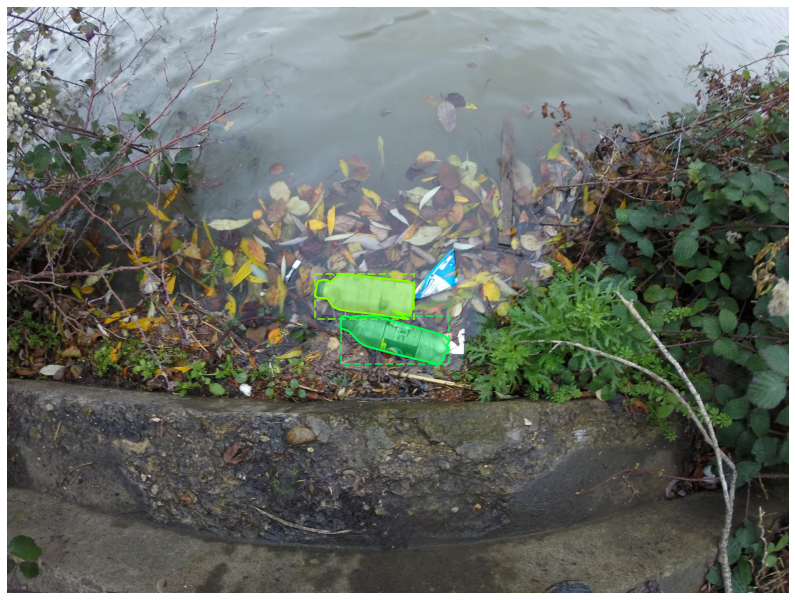

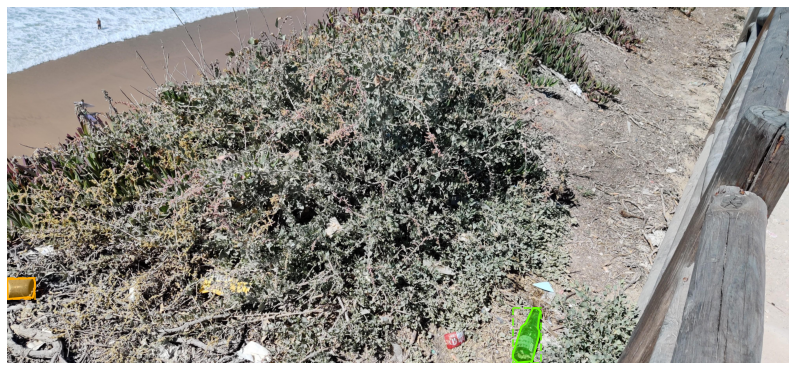

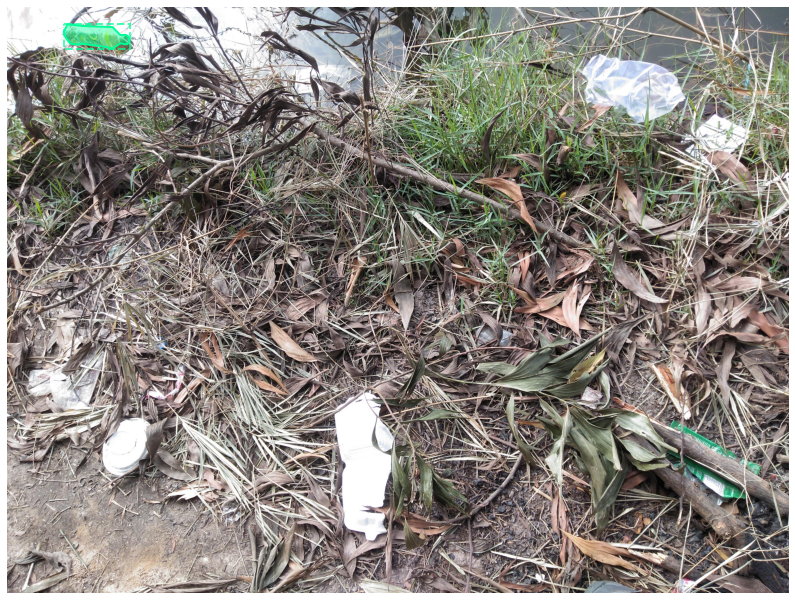

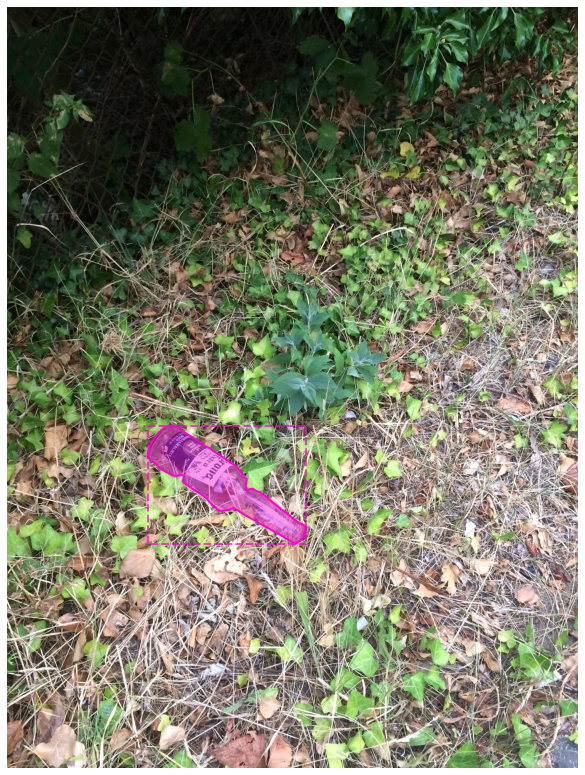

In [18]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
nr_img_2_display = 10
category_name = 'Bottle'#  --- Insert the name of one of the categories or super-categories above
pylab.rcParams['figure.figsize'] = (14,14)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Get image ids
imgIds = []
catIds = coco.getCatIds(catNms=[category_name])
if catIds:
    # Get all images containing an instance of the chosen category
    imgIds = coco.getImgIds(catIds=catIds)
else:
    # Get all images containing an instance of the chosen super category
    catIds = coco.getCatIds(supNms=[category_name])
    for catId in catIds:
        imgIds += (coco.getImgIds(catIds=catId))
    imgIds = list(set(imgIds))

nr_images_found = len(imgIds) 
print('Number of images found: ',nr_images_found)

# Select N random images
random.shuffle(imgIds)
imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)])

for img in imgs:
    image_path = dataset_path + '/' + img['file_name']
    # Load image
    I = Image.open(image_path)
    
    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)
    
    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns_sel = coco.loadAnns(annIds)
    
    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()


In [1]:
import cv2

In [2]:
# Get the proposals for an image
image = cv2.imread('/dtu/datasets1/02514/data_wastedetection/batch_11/000028.jpg')
image = cv2.resize(image,(224,224))
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(image)
ss.switchToSelectiveSearchFast()
prop = ss.process()[:2000]

In [3]:
prop

array([[101, 185,  17,  15],
       [  0, 199,  11,  16],
       [185,   9,  39,  10],
       ...,
       [118,  69, 106, 155],
       [  0, 112, 162, 112],
       [  0,  82, 175, 142]], dtype=int32)

In [58]:


# Get the proposals for an image
image = cv2.imread('/dtu/datasets1/02514/data_wastedetection/batch_11/000028.jpg')
image = cv2.resize(image,(224,224))
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
ss.setBaseImage(image)
ss.switchToSelectiveSearchFast()
prop = ss.process()[:2000]

# Calculate the IoU for each proposal and all the annotations in the image - maybe calculate the IoU and
# get the argmax. We could get an array of 2000 x nr_of_gtruth_in_image (only for super categories)

# In order to calculate the IoU the two boxes have to be two dictionaries
def get_iou(bb1, bb2):
    # assuring for proper dimension.
    assert bb1['x1'] < bb1['x2']
    assert bb1['y1'] < bb1['y2']
    assert bb2['x1'] < bb2['x2']
    assert bb2['y1'] < bb2['y2']
    # calculating dimension of common area between these two boxes.
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])
    # if there is no overlap output 0 as intersection area is zero.
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    # calculating intersection area.
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    # individual areas of both these bounding boxes.
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])
    # union area = area of bb1_+ area of bb2 - intersection of bb1 and bb2.
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou


# Match the box with the annotations for that image given the IoU


AttributeError: module 'cv2' has no attribute 'ximgproc'

In [ ]:


def generate_dataset(sample_ratio, IoU_threshold, padding=16):

  image_dir=dataset_path
  annot_dir=anns_file_path
  obj_counter = 0
  bg_counter = 0
  train_images=[]
  train_labels=[]

  print('[*] Generating dataset for R-CNN.')

  pbar = tqdm(sorted(os.listdir(image_dir))[:2000], position=0, leave=True) # only 2000 images :( <-------------

  for img_name in pbar:   
    pbar.set_description(f"Data size: {len(train_labels)}")

    # load image & gt bounding boxes 
    image = cv2.imread(image_dir + img_name)
    xml_path=annot_dir+img_name[:-4]+'.xml'
    gt_bboxes = self.dataset.read_xml(xml_path)
    # generete bbox proposals via selective search
    rects = selective_search(image)[:2000]  # parse first 2000 boxes
    random.shuffle(rects)
    # loop through all ss bounding box proposals
    for (x, y, w, h) in rects:
      # apply padding
      x1, x2 = np.clip([x-padding, x+w+padding], 0, image.shape[1])
      y1, y2 = np.clip([y-padding, y+h+padding], 0, image.shape[0])
      bbox_est = {'x1':x1, 'y1':y1, 'x2':x2, 'y2':y2}

      # check the proposal with every elements of the gt boxes
      is_object = False # define flag
      for gt_bbox in gt_bboxes:
        iou = calculate_IoU(gt_bbox, bbox_est)

        if iou >= IoU_threshold['positive']: # if object(RoI > 0.5)
          obj_counter+=1
          cropped = image[bbox_est['y1']:bbox_est['y2'], bbox_est['x1']:bbox_est['x2'], :]
          self.train_images.append(cropped)
          #cv2.imwrite(self.data_path+'train_images/'+str(image_count)+'.jpg', cropped) <-- too much drive I/O, timed out
          #image_count+=1
          est_bbox_xywh=((bbox_est['x1'] + bbox_est['x2']) / 2, (bbox_est['y1'] + bbox_est['y2']) / 2,
                          bbox_est['x2']-bbox_est['x1'], bbox_est['y2']-bbox_est['y1'])
          gt_bbox_xywh=((gt_bbox['x1'] + gt_bbox['x2']) / 2, (gt_bbox['y1'] + gt_bbox['y2']) / 2,
                         gt_bbox['x2']-gt_bbox['x1'], gt_bbox['y2']-gt_bbox['y1'])
          self.train_labels.append([gt_bbox['class'], est_bbox_xywh, gt_bbox_xywh])

          is_object = True
          break
      # if the object is not close to any g.t bbox
      if bg_counter < sample_ratio[1] and is_object==False: 
        bg_counter+=1
        cropped = image[bbox_est['y1']:bbox_est['y2'], bbox_est['x1']:bbox_est['x2'], :]
        self.train_images.append(cropped)
        #cv2.imwrite(self.data_path+'train_images/'+str(image_count)+'.jpg', cropped) <-- too much drive I/O, timed out
        #image_count+=1
        est_bbox_xywh=(1.0, 1.0, 1.0, 1.0)
        gt_bbox_xywh=(1.0, 1.0, 1.0, 1.0)
        self.train_labels.append([0, est_bbox_xywh, gt_bbox_xywh])

      if obj_counter >= sample_ratio[0] and bg_counter == sample_ratio[1]:  # control the ratio between 2 types
        obj_counter -= sample_ratio[0]
        bg_counter = 0


  print('[*] Dataset generated! Saving labels to', self.data_path)
  with open(self.data_path + 'train_labels.pkl', 'wb') as f:
    pickle.dump(self.train_labels, f)
  with open(self.data_path + 'train_images.pkl', 'wb') as f:
    pickle.dump(self.train_images, f)
    
    
def get_iou(bb1, bb2):
    # assuring for proper dimension.
    assert bb1['x1'] < bb1['x2']
    assert bb1['y1'] < bb1['y2']
    assert bb2['x1'] < bb2['x2']
    assert bb2['y1'] < bb2['y2']
    # calculating dimension of common area between these two boxes.
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])
    # if there is no overlap output 0 as intersection area is zero.
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    # calculating intersection area.
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    # individual areas of both these bounding boxes.
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])
    # union area = area of bb1_+ area of bb2 - intersection of bb1 and bb2.
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou